## 1. Get images from LOL dataset


In [1]:
# dataset_link = "https://drive.google.com/file/d/1E1rGvhzu0oWMuake4NBDbrKWZOVzDrFP/view?usp=sharing"

In [2]:
# !gdown https://drive.google.com/file/d/1E1rGvhzu0oWMuake4NBDbrKWZOVzDrFP -O LOLdataset

In [3]:
# !wget 'https://drive.google.com/uc?id=1E1rGvhzu0oWMuake4NBDbrKWZOVzDrFP' -o LOLdataset

In [4]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [5]:
import os

In [6]:
os.chdir( os.getcwd() + "/drive/MyDrive/Autoencoder")

In [7]:
!ls

 Autoencoder_LOL_dataset.ipynb			 eval15		   __MACOSX
 checkpoints					'helpers (1).py'   our485
 denoiser_LOL_dataset.pt			 helpers.py	   __pycache__
 Denoising_autoencoder_landscape_dataset.ipynb	 lenna_image.png   with_noise
 denoising_autoencoder_MNIST_dataset.ipynb	 LOLdataset.zip    without_noise


In [8]:
# prompt: unzip LOLDataset.zip

# !unzip LOLdataset

In [9]:
# !mkdir with_noise without_noise

copy images to the with_noise, without_noise folders

In [10]:
# !cp /content/our485/high/*.png /content/without_noise

In [11]:
# !cp /content/our485/low/*.png /content/with_noise

In [12]:
os.chdir(r"/content/drive/MyDrive/Autoencoder")

In [13]:
!ls

 Autoencoder_LOL_dataset.ipynb			 eval15		   __MACOSX
 checkpoints					'helpers (1).py'   our485
 denoiser_LOL_dataset.pt			 helpers.py	   __pycache__
 Denoising_autoencoder_landscape_dataset.ipynb	 lenna_image.png   with_noise
 denoising_autoencoder_MNIST_dataset.ipynb	 LOLdataset.zip    without_noise


## 2. Autoencoder Architecture


In [14]:
import torch, os
import numpy as np
from torchvision import datasets
from torch import nn
import torchvision.models
from torchvision.transforms import v2
from torchvision.datasets import ImageFolder
from PIL import Image
from torch.utils.data import Dataset

from helpers import get_data_loaders, seed_all, anomaly_detection_display
import pandas as pd
import matplotlib.pyplot as plt

# Ensure repeatability
seed_all(42)

In [15]:
class upperLeftCornerCrop(object):
    def __call__(self, img):
        # Ensure the input is a PIL Image
        if not isinstance(img, Image.Image):
            raise TypeError("Input image should be a PIL Image. Got {}".format(type(img)))

        # Crop the image to 200x200 pixels from the upper-left corner
        cropped_img = img.crop((0, 0, 200, 200))
        return cropped_img

In [16]:
img_transform = v2.Compose([
    upperLeftCornerCrop(), # Crop the image to 200x200 pixels from the upper-left corner
    v2.ToTensor(), # normalise the image matrix (Convert PIL image 0-255 -> 0-1)
])


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/v2/_deprecated.py:43: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.
  warnings.warn(


In [17]:
class LOLDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.images = os.listdir(root_dir)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir, self.images[idx])
        image = Image.open(img_name).convert('RGB')

        if self.transform:
            image = self.transform(image)

        return image


In [18]:
validation_clean_dataset = LOLDataset(os.getcwd()+"/eval15/high/",transform=img_transform)
validation_noisy_dataset = LOLDataset(os.getcwd() + "/eval15/low/",transform=img_transform)

In [19]:
noisy_dataset = LOLDataset(os.getcwd()+"/with_noise", transform=img_transform)
clean_dataset = LOLDataset(os.getcwd() + "/without_noise", transform=img_transform)

In [20]:
from torch.utils.data import DataLoader

batch_size = 64 # for testing changed this to 1 from 64
shuffle = False

noisy_data_loader = DataLoader(noisy_dataset, batch_size=batch_size, shuffle=shuffle)
clean_data_loader = DataLoader(clean_dataset, batch_size = batch_size, shuffle=shuffle)

In [21]:
# Test data loaders
noisy_test_data_loader = DataLoader(validation_noisy_dataset, batch_size=batch_size, shuffle=shuffle)
clean_test_data_loader = DataLoader(validation_clean_dataset, batch_size = batch_size, shuffle=shuffle)

In [22]:
print(f"{len(noisy_data_loader)}")
print(len(clean_test_data_loader))

1
1


In [23]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

# Assuming 'transform' is your transformation pipeline (including ToTensor)
# Example tensor (replace this with your actual tensor)
# tensor_image = torch.rand(3, 224, 224)  # Example random tensor with shape (channels, height, width)

# Convert tensor to a PIL image
tensor_to_pil = transforms.ToPILImage()

# Function to show tensor image
def showImage(tensoredImage):

  # Display the image using Matplotlib
  plt.imshow(tensor_to_pil(tensoredImage))
  plt.axis('off')  # Hide axis ticks and labels
  plt.show()


In [24]:
# sample_with_noise_img

In [25]:
# sample_id = 18

# sample_noisy_img = noisy_dataset.__getitem__(sample_id)
# sample_clean_img = clean_dataset.__getitem__(sample_id)

# showImage(sample_clean_img)


In [26]:
# showImage(sample_noisy_img)

In [27]:
# sample_noisy_img.shape

In [28]:
import torch.nn as nn
import torch.nn.functional as F

In [29]:
import torch.nn as nn
import torch.nn.functional as F
import copy

# define the NN architecture
class ConvDenoiser(nn.Module):
    def __init__(self):
        super(ConvDenoiser, self).__init__()
        ## encoder layers ##
        self.encoder = nn.Sequential(
            # in_channels : number of channels per image ; for RGB -> 3
            # out_channels : number of convolutional filters with #in_channel of kernels per filters
            nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1,stride=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=32), # number of channels are the features
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(in_channels=32, out_channels=16, kernel_size=3, padding=1,stride=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=16),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(in_channels=16, out_channels=8,kernel_size=3, padding=1,stride=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=8),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(in_channels=8, out_channels=8, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(8),
            nn.ConvTranspose2d(8, 16, 2, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(16),
            nn.ConvTranspose2d(16, 32, 2, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(32),
            nn.Conv2d(in_channels=32, out_channels=3, kernel_size=3, padding=1, stride=1),
            nn.Sigmoid()
        )

        self.model = nn.Sequential(
            self.encoder,
            self.decoder
        )


    def forward(self, x):

        # # Print the shape of the input tensor
        # print("Input Shape:", x.shape)

        # x = self.encoder(x)
        # # Print the shape after encoding
        # print("Encoded Shape:", x.shape)

        # x = self.decoder(x)
        # # Print the shape after decoding
        # print("Decoded Shape:", x.shape)

        return self.model(x)

    def get_encoder_architecture(self):
      print("*** Encoder Architecture")
      print(self.encoder)

    def get_decoder_architecture(self):
      print("*** Decoder Architecture")
      print(self.decoder)

    def debug_encoder(self,x,printDebugOutput=True):
      """Pass thorugh a dataloader with one image per batch"""
      encoder_test_tensor = copy.deepcopy(x)

      print("\nPassing thorugh Encoder >>> \n")
      print("Original Image size : ")
      print(encoder_test_tensor.shape)

      for i, layer in enumerate(self.encoder):

        encoder_test_tensor = layer(encoder_test_tensor)

        if printDebugOutput:
          print("layer " ,i, ": ", layer )
          print(encoder_test_tensor.shape)


      return encoder_test_tensor

    def debug_decoder(self,x,printDebugOutput=True):
      """Pass through a dataloader with one image per batch"""
      # decoder_test_tensor = copy.deepcopy(x)
      decoder_test_tensor = x

      print("\nPassing thorugh Decoder >>> \n")
      print("Original Input size : ")
      print(decoder_test_tensor.shape)

      for i, layer in enumerate(self.decoder):

        decoder_test_tensor = layer(decoder_test_tensor)

        if printDebugOutput:
          print("layer " ,i, ": ", layer )
          print(decoder_test_tensor.shape)

      return decoder_test_tensor

# initialize the NN
model = ConvDenoiser()

model.get_encoder_architecture()
# encoder_output = model.debug_encoder(test,printDebugOutput=False)
# decoder_output = model.debug_decoder(encoder_output,printDebugOutput=True)

*** Encoder Architecture
Sequential(
  (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU()
  (2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (4): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (5): ReLU()
  (6): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (8): Conv2d(16, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (9): ReLU()
  (10): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
)


In [30]:
# Specify loss function
criterion = nn.MSELoss()

# Specify optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [31]:
# Check if CUDA is available
if torch.cuda.is_available():
    print("CUDA is available!")
    # Get the number of available GPUs
    num_devices = torch.cuda.device_count()
    print(f"Number of available GPUs: {num_devices}")
    # Get the current GPU device
    current_device = torch.cuda.current_device()
    print(f"Current GPU device: {current_device}")
    # Get the name of the GPU
    gpu_name = torch.cuda.get_device_name(current_device)
    print(f"GPU name: {gpu_name}")
else:
    print("CUDA is not available. Using CPU.")


CUDA is not available. Using CPU.


## 2.1 Check dimensions

## 3. Training


In [32]:
from tqdm import tqdm

In [33]:
# Number of epochs to train the model
n_epochs = 30

In [34]:
# Check if CUDA (GPU support) is available, and if available, use GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [35]:
len_data_loader = len(noisy_data_loader)


In [36]:
clean_loader , noisy_loader = clean_data_loader, noisy_data_loader

In [37]:
!mkdir checkpoints

mkdir: cannot create directory ‘checkpoints’: File exists


In [38]:
save_path = "denoiser_LOL_dataset.pt"

### Check dimensions

In [39]:
for i, v in enumerate(noisy_loader):
  # print(i, " : ", v.shape)
  # count += v.shape
  if i == 14:
    showImage(v[0])
    break


In [40]:
# v.shape

# Testing dimensions


In [41]:
for i, noisy_images in enumerate(noisy_data_loader):
  test = noisy_images
  print(i, noisy_images.shape)
  break

0 torch.Size([50, 3, 200, 200])


In [42]:
test.shape

torch.Size([50, 3, 200, 200])

### Adding dimensions


___


In [43]:
# # first
# test1 = noisy_img[:,None]
# test1.shape

In [44]:
# # second method
# test2 = noisy_img.unsqueeze(1)
# test2.shape

In [45]:
# # third method : tensor > np array ; add dimenstion ; np array > tensor
# print(f"{type(noisy_img)}\n")
# noisy_img_arr = noisy_img.numpy()
# print(f"{type(noisy_img_arr)}")

In [46]:
# showImage(noisy_img)

In [47]:
# noisy_img_channels = red_channel , blue_channel , green_channel= noisy_img[0], noisy_img[1], noisy_img[2]

In [48]:
# for channel in noisy_img_channels:
#   showImage(red_channel)

In [49]:
isTraining = False

In [50]:
# Training loop
if isTraining:
  num_epochs = 30
  for epoch in range(num_epochs):
      model.to(device)
      # model.train()
      running_loss = 0.0
      for clean_images, noisy_images in zip(clean_loader, noisy_loader):
          # Move data to GPU if available
          clean_images = clean_images.to(device)
          noisy_images = noisy_images.to(device)

          # clear the gradients of all optimized variables
          optimizer.zero_grad()

          ## forward pass: compute predicted outputs by passing *noisy* images to the model
          # clean_reconstructed = model(clean_images)
          noisy_reconstructed = model(noisy_images)

          # Compute the loss (MSE between clean and reconstructed images)
          # loss = criterion(clean_reconstructed, clean_images) + criterion(noisy_reconstructed, noisy_images)

          # calculate the loss
          # the "target" is still the original, not-noisy images

          loss = criterion(noisy_reconstructed, clean_images)

          # backward pass: compute gradient of the loss with respect to model parameters
          loss.backward()
          # perform a single optimization step (parameter update)
          optimizer.step()

          # Update running loss
          running_loss += loss.item()


      # Print average loss for the epoch
      print(f"Epoch [{epoch+1}/{num_epochs}] - Loss: {running_loss / len(clean_loader)}")
      torch.save(model.state_dict(), save_path)
      print("Model was saved...")


In [51]:
!ls

 Autoencoder_LOL_dataset.ipynb			 eval15		   __MACOSX
 checkpoints					'helpers (1).py'   our485
 denoiser_LOL_dataset.pt			 helpers.py	   __pycache__
 Denoising_autoencoder_landscape_dataset.ipynb	 lenna_image.png   with_noise
 denoising_autoencoder_MNIST_dataset.ipynb	 LOLdataset.zip    without_noise


In [52]:
if isTraining:
  torch.save(model.state_dict(), "checkpoints/denoiser_LOL_dataset.pt")

## 4. Evaluation
## 5. Inference

## 4.1 Load Model from the saved checkpoints


In [53]:
# prompt: ## 4.1 Load Model from the saved checkpoints
lol_model = ConvDenoiser()
lol_model = lol_model.to(device)
lol_model.load_state_dict(torch.load("checkpoints/denoiser_LOL_dataset.pt"))


<All keys matched successfully>

## Inference

In [54]:
print(noisy_test_data_loader)
clean_test_data_loader


In [55]:
# validation_noisy_data_loader
# clean_data_loader

0  :  torch.Size([15, 3, 200, 200])


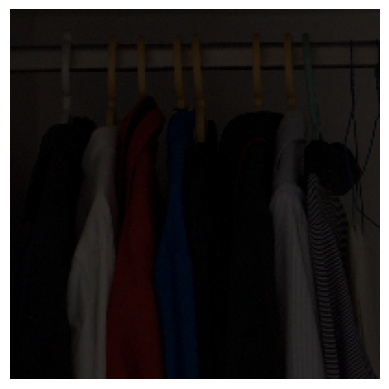

In [56]:
for i, v in enumerate(noisy_test_data_loader):
  print(i, " : ", v.shape)
  # count += v.shape
  if i == 0:
    showImage(v[0])
    break

In [57]:
noisy_test_iter = iter(noisy_test_data_loader)
clean_test_iter = iter(clean_test_data_loader)

0  :  torch.Size([15, 3, 200, 200])


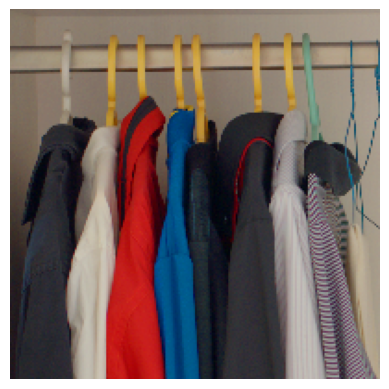

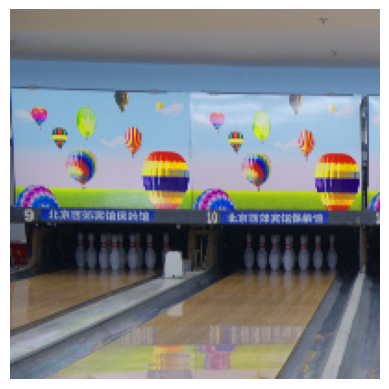

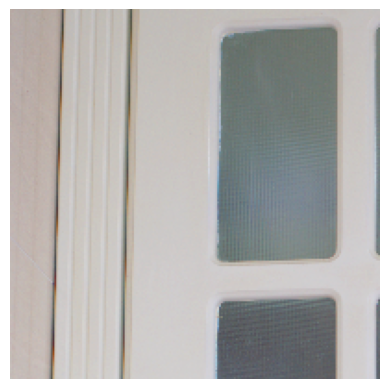

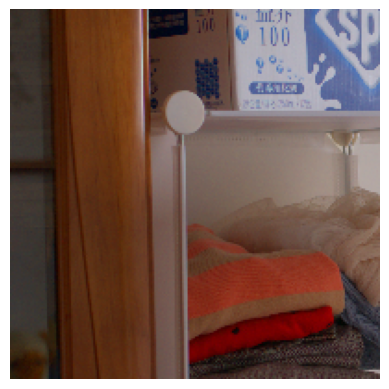

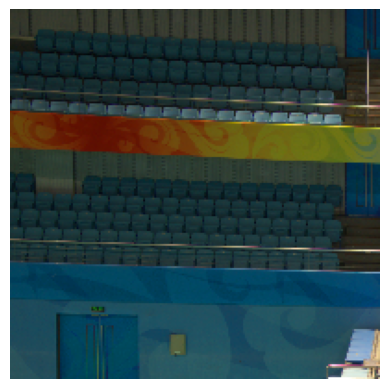

...

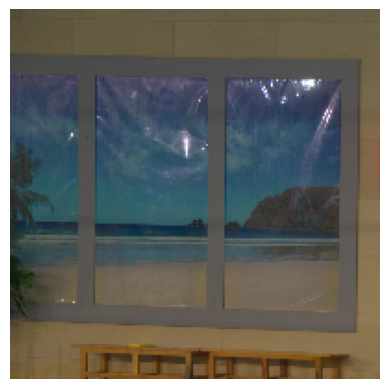

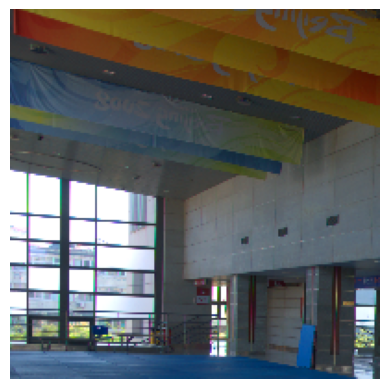

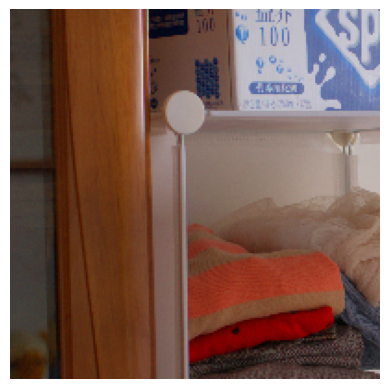

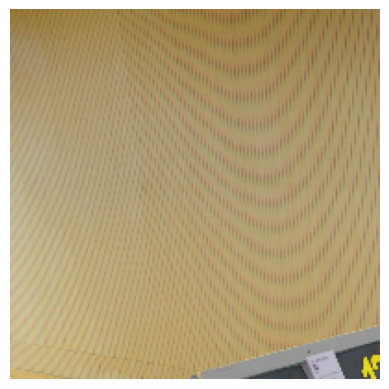

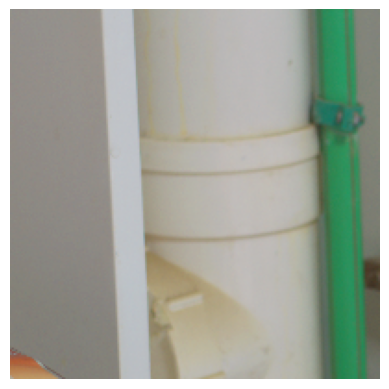

In [58]:
for i, v in enumerate(clean_test_data_loader):
  print(i, " : ", v.shape)
  # count += v.shape
  for j in range(v.shape[0]):
    showImage(v[j])
  # if i == 0:
    # showImage(v[0])
    # break




In [59]:

def showImages_side_by_side(image1, image2, image1_title, image2_title):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))  # Create a figure with two subplots
    axes[0].imshow(tensor_to_pil(image1))  # Show the first image on the left subplot
    axes[0].axis('off')  # Hide axis for the left subplot
    axes[0].set_title(image1_title)  # Set title for the left subplot

    axes[1].imshow(tensor_to_pil(image2))  # Show the second image on the right subplot
    axes[1].axis('off')  # Hide axis for the right subplot
    axes[1].set_title(image2_title)  # Set title for the right subplot

    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.show()


def showImages3(image1, image2,image3, image1_title, image2_title, image3_title):
    axis_show = "off"
    fig, axes = plt.subplots(1, 3, figsize=(10,5))  # Create a figure with two subplots
    axes[0].imshow(tensor_to_pil(image1))  # Show the first image on the left subplot
    axes[0].axis(axis_show)  # Hide axis for the left subplot
    axes[0].set_title(image1_title)  # Set title for the left subplot

    axes[1].imshow(tensor_to_pil(image2))  # Show the second image on the right subplot
    axes[1].axis(axis_show)  # Hide axis for the right subplot
    axes[1].set_title(image2_title)  # Set title for the right subplot

    axes[2].imshow(tensor_to_pil(image3))  # Show the second image on the right subplot
    axes[2].axis(axis_show)  # Hide axis for the right subplot
    axes[2].set_title(image3_title)  # Set title for the right subplot

    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.show()


torch.Size([15, 3, 200, 200]) torch.Size([15, 3, 200, 200])


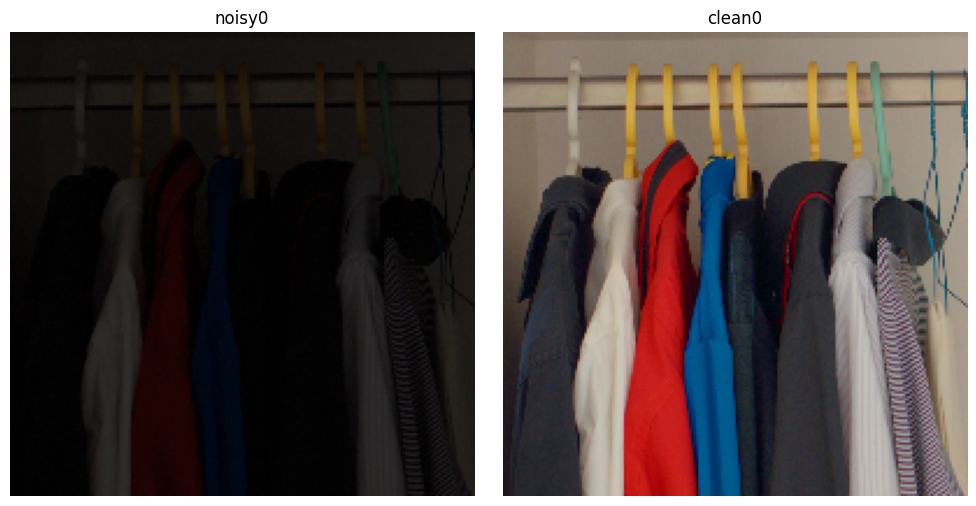

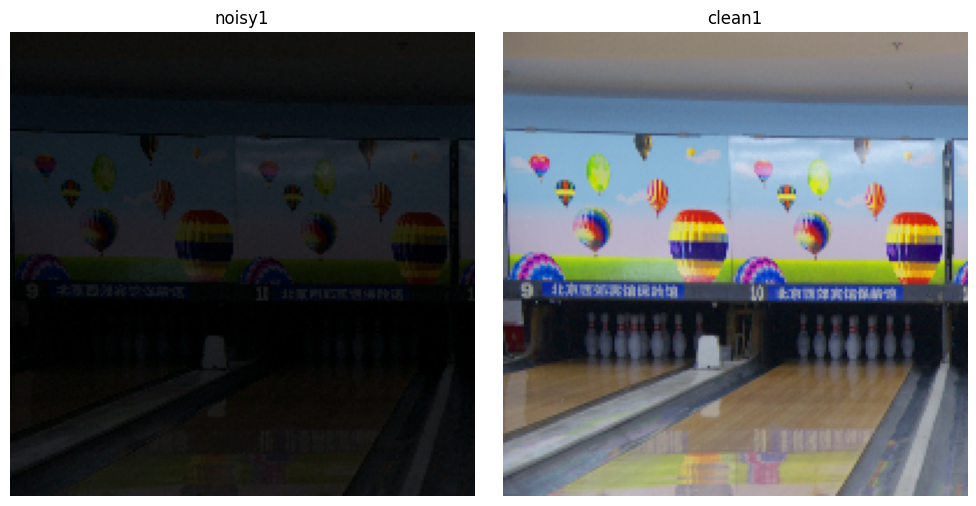

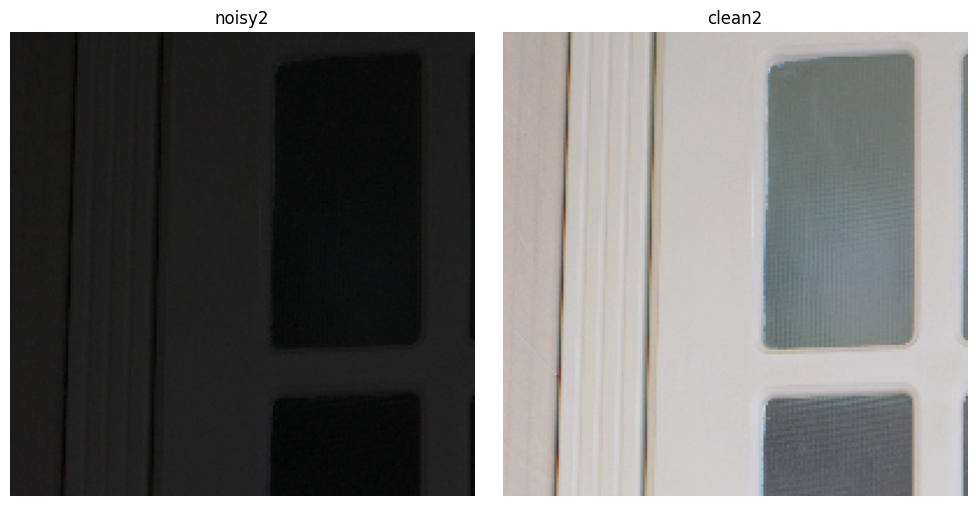

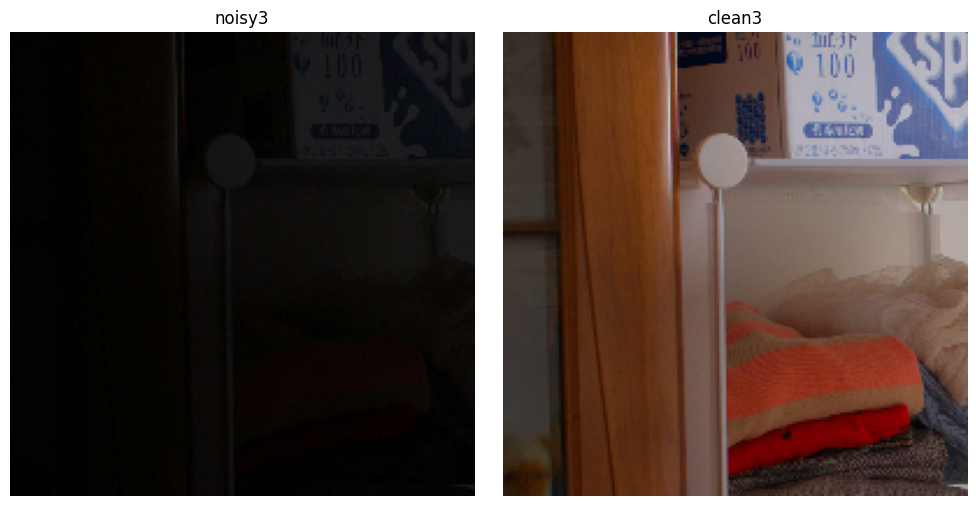

In [60]:
from itertools import zip_longest

for noisy_test_batch, clean_test_batch in zip_longest(noisy_test_data_loader, clean_test_data_loader):
  print(noisy_test_batch.shape, clean_test_batch.shape)

  for i in range(noisy_test_batch.shape[0]):
    noisy_test_img = noisy_test_batch[i]
    clean_test_img = clean_test_batch[i]
    showImages_side_by_side(noisy_test_img, clean_test_img, f"noisy{i}", f"clean{i}")

    if i == 3:
      break


In [61]:
for i, v in enumerate(noisy_test_data_loader):
  print(i, " : ", v.shape)
  # count += v.shape
  for j in range(v.shape[0]):
    pass
    # showImage(v[j])
  # if i == 0:
    # showImage(v[0])
    # break




0  :  torch.Size([15, 3, 200, 200])


torch.Size([15, 3, 200, 200]) torch.Size([15, 3, 200, 200])


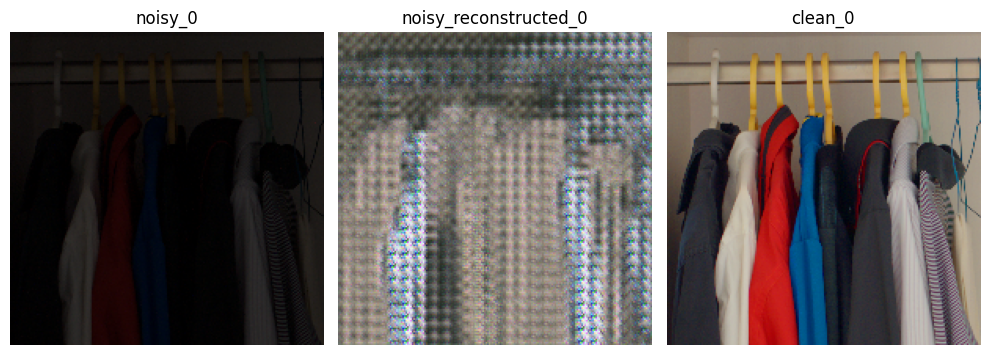

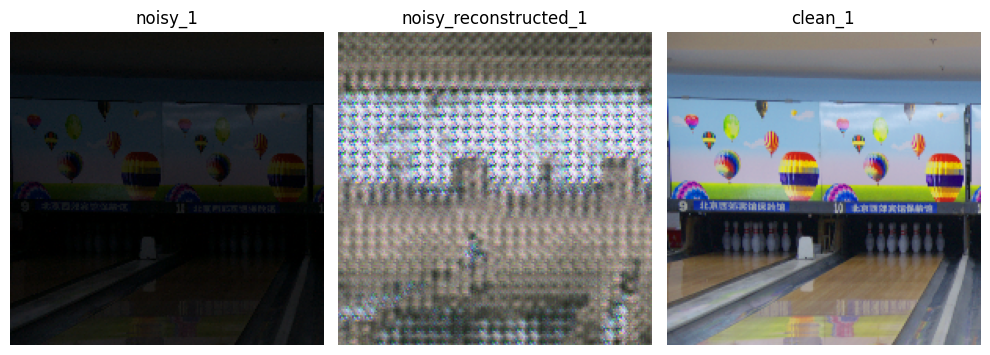

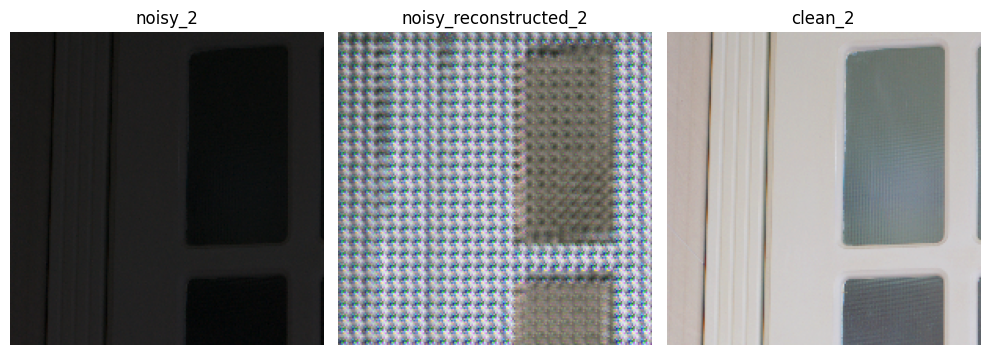

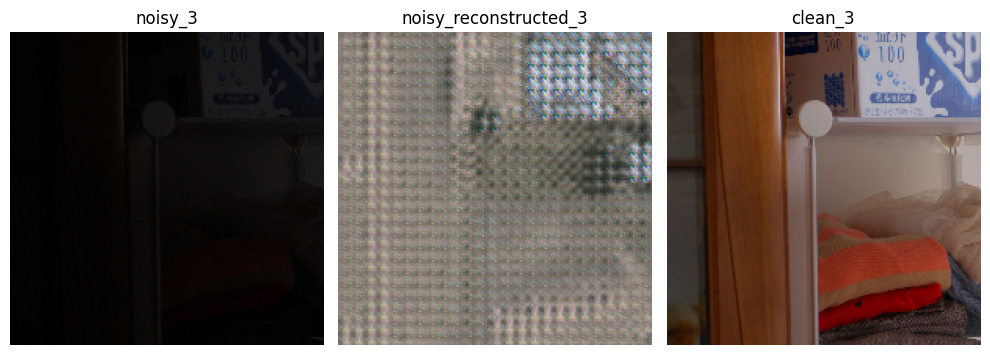

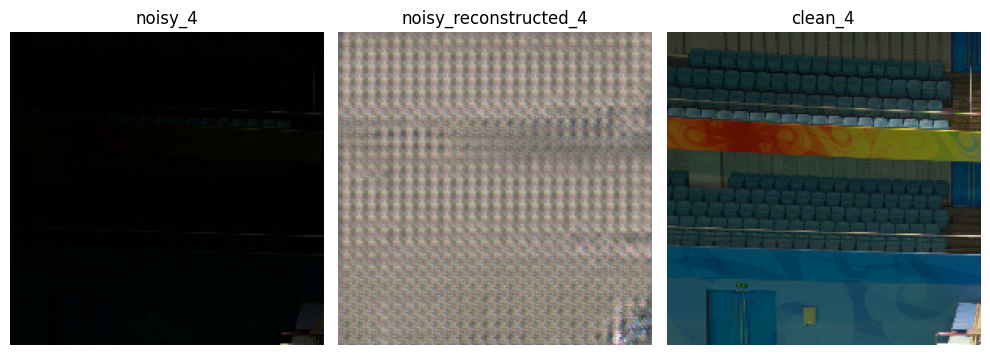

...

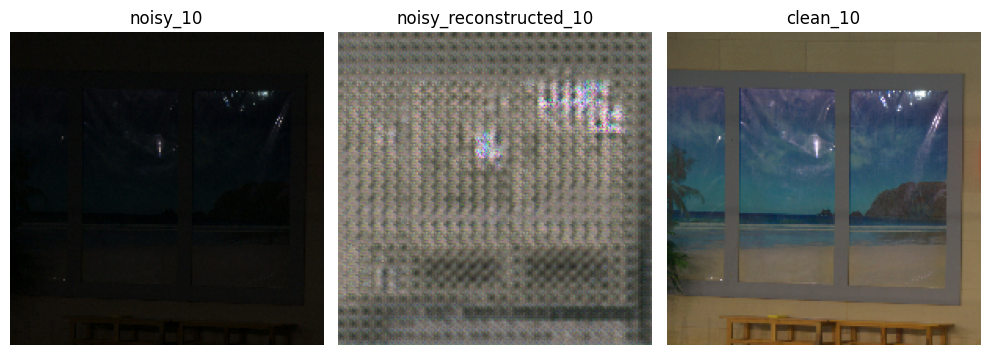

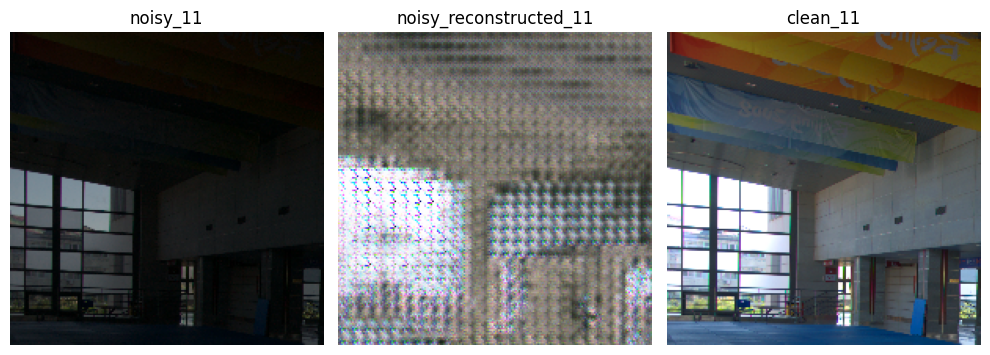

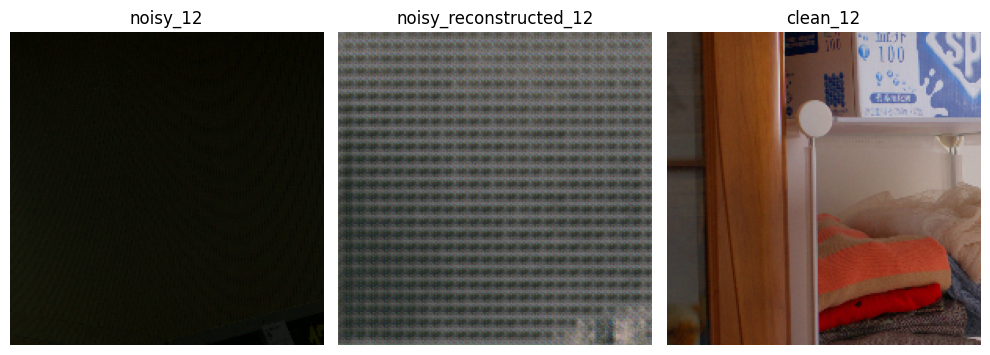

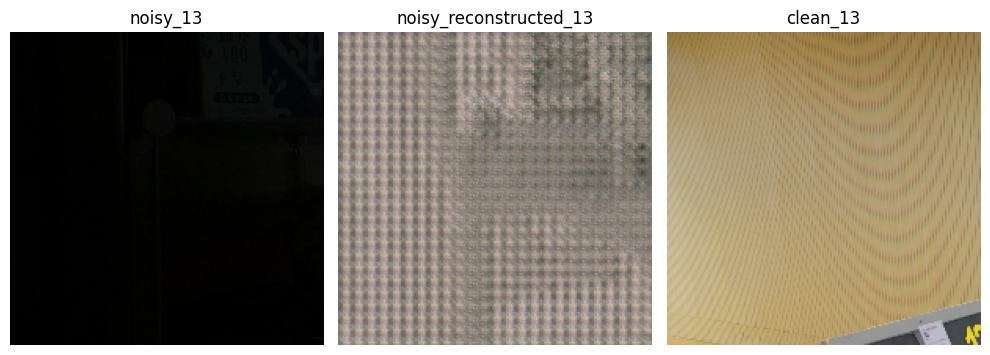

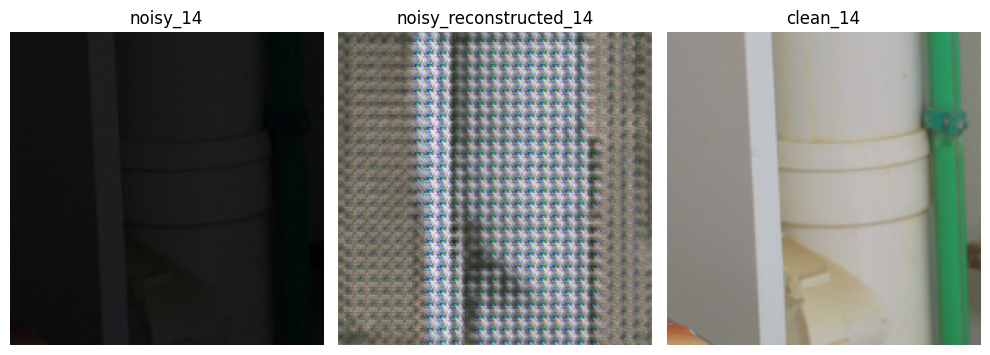

In [62]:
from itertools import zip_longest

for noisy_test_batch, clean_test_batch in zip_longest(noisy_test_data_loader, clean_test_data_loader):
  print(noisy_test_batch.shape, clean_test_batch.shape)

  noisy_reconstructed = lol_model(noisy_test_batch.to(device))

  for i in range(noisy_test_batch.shape[0]):
    noisy_test_img = noisy_test_batch[i]
    noisy_recons_img = noisy_reconstructed[i]
    clean_test_img = clean_test_batch[i]
    showImages3(noisy_test_img, noisy_recons_img, clean_test_img,f"noisy_{i}", f"noisy_reconstructed_{i}", f"clean_{i}")
    # pass

    # if i == 3:
    #   break


### Remarks:
The output results are not that great. :(

I used darker images to brighten. I considered the darkness is somekind of noise. Then added tried to remove it from the images.

- darkened image signal =  $d(x,y,c)$

- darkness noise =  $n(x,y,c)$

- brightned image signal = $b(x,y,c)$

- brightened image signal = $\hat{b}(x,y,c)$

What I am trying to achieve :

- Decrease  $\hat{b}(x,y,c) - b(x,y,c)$ using _MSE_`

In [63]:
noisy_reconstructed.shape

torch.Size([15, 3, 200, 200])

0  :  torch.Size([50, 3, 200, 200])


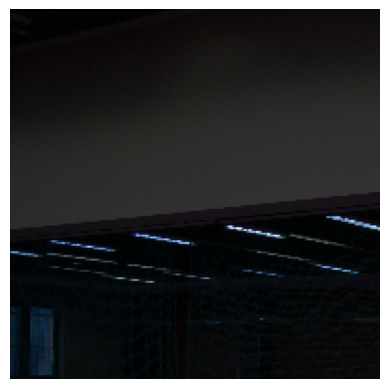

In [64]:

for i, v in enumerate(noisy_data_loader):
  print(i, " : ", v.shape)
  # count += v.shape

  for j in range(v.shape[0]):
    pass
    # showImage(v[j])
  if i == 0:
    showImage(v[0])
    break




In [65]:
!pip install livelossplot
from livelossplot import PlotLosses

## 3rd Attempt

I didn't change the architecture of the model.
- I tried feeding the clean images and tried whether I can recreate the original clean image.
- As you can see for some extent, my model has recreated the original image.
- I am using an architecture which was used for MNIST data.
- This is not enough, So I am trying to achieve high accuracy with higher number of features in the `feature vector`.
- I was advised use 128 features instead of 8 features in the feature vector. and add some layers to extract more features.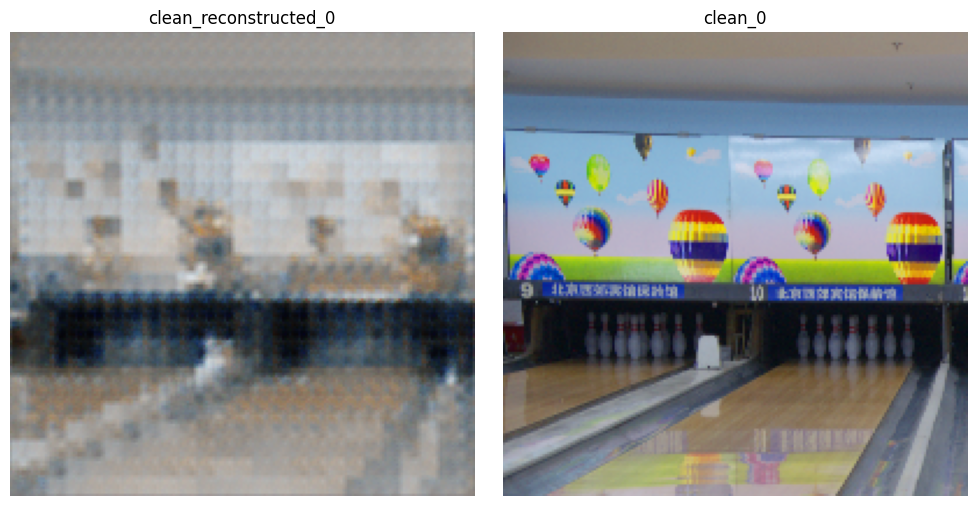



In [66]:
# Create a live plot instance
liveplot = PlotLosses()

# Initialize an empty list to store the loss values
loss_values = []

# Tried training again ####################################

save_path = "checkpoints/clean_lol_model_attempt_3.pt"

isTraining = False

# prompt: ## 4.1 Load Model from the saved checkpoints
clean_lol_model = ConvDenoiser()

# Define optimizer and criterion
optimizer = torch.optim.Adam(clean_lol_model.parameters(), lr=0.001)
criterion = torch.nn.MSELoss()  # Assuming MSE loss for denoising

# Training loop
if isTraining:
    clean_lol_model.to(device)  # Move the model to the device
    num_epochs = 40
    for epoch in range(num_epochs):
        running_loss = 0.0
        for clean_images in clean_data_loader:
            clean_images = clean_images.to(device)
            optimizer.zero_grad()

            noisy_reconstructed = clean_lol_model(clean_images)

            loss = criterion(noisy_reconstructed, clean_images)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        average_loss = running_loss / len(clean_data_loader)
        loss_values.append(average_loss)

        logs = {'loss': average_loss}
        liveplot.update(logs)

        print(f"Epoch [{epoch+1}/{num_epochs}] - Loss: {average_loss}")  # Corrected the printing of loss

        if epoch % 5 == 0:  # Save model weights periodically
            torch.save(clean_lol_model.state_dict(), save_path)
            print("Model was saved...")

        liveplot.draw()

In [67]:
# for clean_test_batch in clean_test_data_loader:
#   print(clean_test_batch.shape)

#   clean_reconstructed = clean_lol_model(clean_test_batch.to(device))

#   for i in range(clean_test_batch.shape[0]):
#     noisy_test_img = noisy_test_batch[i]
#     reconstructed_images = clean_reconstructed[i]
#     clean_test_img = clean_test_batch[i]

#     showImages_side_by_side( reconstructed_images, clean_test_img,f"clean_reconstructed_{i}", f"clean_{i}")


# Modified Architecture

In [68]:
for i,v in enumerate(clean_data_loader):
  print(i)
  print(v.shape)

0
torch.Size([50, 3, 200, 200])


In [69]:
test = v

In [70]:
import torch.nn as nn
import torch.nn.functional as F
import copy

# define the NN architecture
class ModConvDenoiser(nn.Module):
    def __init__(self):
        super(ModConvDenoiser, self).__init__()
        ## encoder layers ##
        self.encoder = nn.Sequential(
            # in_channels : number of channels per image ; for RGB -> 3
            # out_channels : number of convolutional filters with #in_channel of kernels per filters

            # -------------------------------------------------------
            nn.Conv2d(in_channels=3, out_channels=512, kernel_size=3, padding=1,stride=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=512), # number of channels are the features
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(in_channels=512, out_channels=256, kernel_size=3, padding=1,stride=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=256),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(in_channels=16, out_channels=8,kernel_size=3, padding=1,stride=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=128),
            nn.MaxPool2d(kernel_size=128, stride=2)
        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(in_channels=128, out_channels=128, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(128),

            nn.ConvTranspose2d(in_channels=128, out_channels=256, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(256),

            nn.ConvTranspose2d(in_channels=256, out_channels=512,kernel_size=2, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(512),
            nn.Conv2d(in_channels=512, out_channels=3, kernel_size=3, padding=1, stride=1),
            nn.Sigmoid()
        )

        self.model = nn.Sequential(
            self.encoder,
            self.decoder
        )


    def forward(self, x):

        # # Print the shape of the input tensor
        # print("Input Shape:", x.shape)

        # x = self.encoder(x)
        # # Print the shape after encoding
        # print("Encoded Shape:", x.shape)

        # x = self.decoder(x)
        # # Print the shape after decoding
        # print("Decoded Shape:", x.shape)

        return self.model(x)

    def get_encoder_architecture(self):
      print("*** Encoder Architecture")
      print(self.encoder)

    def get_decoder_architecture(self):
      print("*** Decoder Architecture")
      print(self.decoder)

    def debug_encoder(self,x,printDebugOutput=True):
      """Pass thorugh a dataloader with one image per batch"""
      encoder_test_tensor = copy.deepcopy(x)

      print("\nPassing thorugh Encoder >>> \n")
      print("Original Image size : ")
      print(encoder_test_tensor.shape)

      for i, layer in enumerate(self.encoder):

        encoder_test_tensor = layer(encoder_test_tensor)

        if printDebugOutput:
          print("layer " ,i, ": ", layer )
          print(encoder_test_tensor.shape)


      return encoder_test_tensor

    def debug_decoder(self,x,printDebugOutput=True):
      """Pass through a dataloader with one image per batch"""
      # decoder_test_tensor = copy.deepcopy(x)
      decoder_test_tensor = x

      print("\nPassing thorugh Decoder >>> \n")
      print("Original Input size : ")
      print(decoder_test_tensor.shape)

      for i, layer in enumerate(self.decoder):

        decoder_test_tensor = layer(decoder_test_tensor)

        if printDebugOutput:
          print("layer " ,i, ": ", layer )
          print(decoder_test_tensor.shape)

      return decoder_test_tensor

# initialize the NN
model = ModConvDenoiser()

model.get_encoder_architecture()
# encoder_output = model.debug_encoder(test,printDebugOutput=False)
# decoder_output = model.debug_decoder(encoder_output,printDebugOutput=True)

*** Encoder Architecture
Sequential(
  (0): Conv2d(3, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU()
  (2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (4): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (5): ReLU()
  (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (8): Conv2d(16, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (9): ReLU()
  (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (11): MaxPool2d(kernel_size=128, stride=2, padding=0, dilation=1, ceil_mode=False)
)


In [71]:
# Create a live plot instance
liveplot = PlotLosses()

# Initialize an empty list to store the loss values
loss_values = []

# Tried training again ####################################

save_path = "checkpoints/modified_archi_model_attempt_3.pt"

isTraining = True

# prompt: ## 4.1 Load Model from the saved checkpoints
clean_lol_model = ModConvDenoiser()

# Define optimizer and criterion
optimizer = torch.optim.Adam(clean_lol_model.parameters(), lr=0.001)
criterion = torch.nn.MSELoss()  # Assuming MSE loss for denoising

# Training loop
if isTraining:
    clean_lol_model.to(device)  # Move the model to the device
    num_epochs = 40
    for epoch in range(num_epochs):
        running_loss = 0.0
        for clean_images in clean_data_loader:
            clean_images = clean_images.to(device)
            optimizer.zero_grad()

            # noisy_reconstructed = clean_lol_model(clean_images)

            loss = criterion(noisy_reconstructed, clean_images)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        average_loss = running_loss / len(clean_data_loader)
        loss_values.append(average_loss)

        logs = {'loss': average_loss}
        liveplot.update(logs)

        print(f"Epoch [{epoch+1}/{num_epochs}] - Loss: {average_loss}")  # Corrected the printing of loss

        if epoch % 5 == 0:  # Save model weights periodically
            torch.save(clean_lol_model.state_dict(), save_path)
            print("Model was saved...")

        liveplot.draw()

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([50, 3, 200, 200])) that is different to the input size (torch.Size([15, 3, 200, 200])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


RuntimeError: The size of tensor a (15) must match the size of tensor b (50) at non-singleton dimension 0

In [ ]:
len(clean_data_loader)